In [6]:
import os
import zipfile

 #Define the path to the zipped dataset
zip_path = r'C:\Users\FAISAL\Downloads\plantdiseasedetection.zip'

#Define extraction path
extract_path = r'C:\Users\FAISAL\Machine_learning\myproject'

 #Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted to:", extract_path)

Dataset extracted to: C:\Users\FAISAL\Machine_learning\myproject


# **Performing EDA**

# 1. load the dataset

In [1]:
import os

# Path to your dataset
train_path= r'C:\Users\FAISAL\Machine_learning\myproject\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train'
valid_path= r'C:\Users\FAISAL\Machine_learning\myproject\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid'

# List all subdirectories (representing different categories or classes)
subdirs_train = os.listdir(train_path)
subdirs_valid = os.listdir(valid_path)

print("categories in train directory:", subdirs_train)
print("Total categories in train directory",len(subdirs_train))
print("\n")
print("categories in valid directory:", subdirs_valid)
print("Total categories in valid directory",len(subdirs_valid))


print("\n")
print("categories in train directory and number of images in it")
total_train_images = 0
for subdir in subdirs_train:
    dir_path = os.path.join(train_path, subdir)
    num_files = len(os.listdir(dir_path))
    total_train_images += num_files
    print(f"{subdir}: {num_files} images")
print("Total images in train directory:", total_train_images)
print("\n")
print("categories in valid directory and number of images in it")
total_valid_images = 0
for subdir in subdirs_valid:
    dir_path = os.path.join(valid_path, subdir)
    num_files = len(os.listdir(dir_path))
    total_valid_images += num_files
    print(f"{subdir}: {num_files} images")
print("Total images in valid directory:", total_valid_images)


categories in train directory: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot', 'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy', 'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy', 'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_

✅**WE GOT DATASET IS DIVIDED INTO 80/20 RATIO AND DATASET IS DIVIDED INTO TRAIN AND VALIDATION DIRECTORIES ALREADY**

# 2. CHECK FOR CLASS DISTRIBUTION


Training set class distribution: {'Apple___Apple_scab': 2016, 'Apple___Black_rot': 1987, 'Apple___Cedar_apple_rust': 1760, 'Apple___healthy': 2008, 'Blueberry___healthy': 1816, 'Cherry_(including_sour)___healthy': 1826, 'Cherry_(including_sour)___Powdery_mildew': 1683, 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 1642, 'Corn_(maize)___Common_rust_': 1907, 'Corn_(maize)___healthy': 1859, 'Corn_(maize)___Northern_Leaf_Blight': 1908, 'Grape___Black_rot': 1888, 'Grape___Esca_(Black_Measles)': 1920, 'Grape___healthy': 1692, 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 1722, 'Orange___Haunglongbing_(Citrus_greening)': 2010, 'Peach___Bacterial_spot': 1838, 'Peach___healthy': 1728, 'Pepper,_bell___Bacterial_spot': 1913, 'Pepper,_bell___healthy': 1988, 'Potato___Early_blight': 1939, 'Potato___healthy': 1824, 'Potato___Late_blight': 1939, 'Raspberry___healthy': 1781, 'Soybean___healthy': 2022, 'Squash___Powdery_mildew': 1736, 'Strawberry___healthy': 1824, 'Strawberry___Leaf_scorch': 17

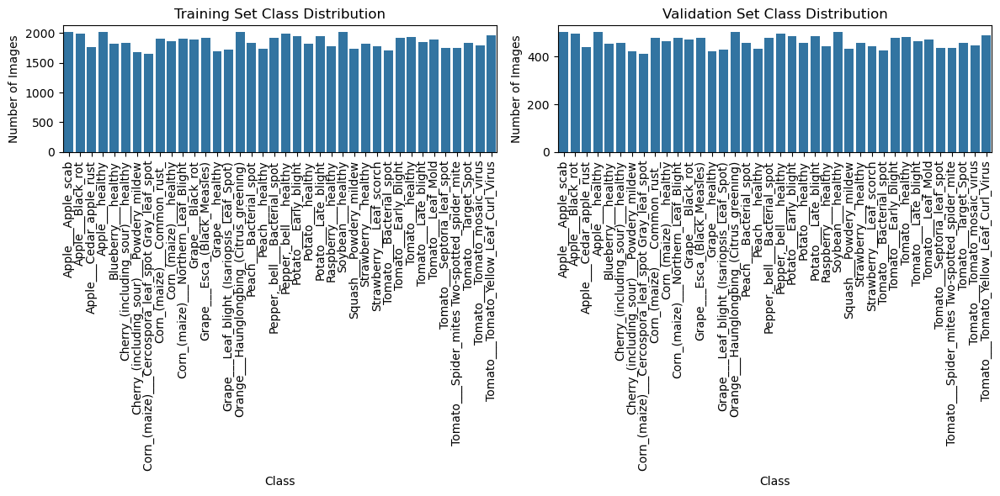

In [2]:

import seaborn as sns
import matplotlib.pyplot as plt



# Count the number of images per class in the training set
train_class_counts = {subdir: len(os.listdir(os.path.join(train_path, subdir))) for subdir in os.listdir(train_path)}
print("Training set class distribution:", train_class_counts)

# Count the number of images per class in the validation set
val_class_counts = {subdir: len(os.listdir(os.path.join(valid_path, subdir))) for subdir in os.listdir(valid_path)}
print("Validation set class distribution:", val_class_counts)

# Plot the class distribution for the training set
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)  # (row, column, position)
sns.barplot(x=list(train_class_counts.keys()), y=list(train_class_counts.values()))
plt.xticks(rotation=90)
plt.title('Training Set Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')

# Plot the class distribution for the validation set
plt.subplot(1, 2, 2)
sns.barplot(x=list(val_class_counts.keys()), y=list(val_class_counts.values()))
plt.xticks(rotation=90)
plt.title('Validation Set Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')

plt.tight_layout()
plt.show()




✅***DATASET IS BALANCED***





# 3. PREVIEW SOME IMAGES

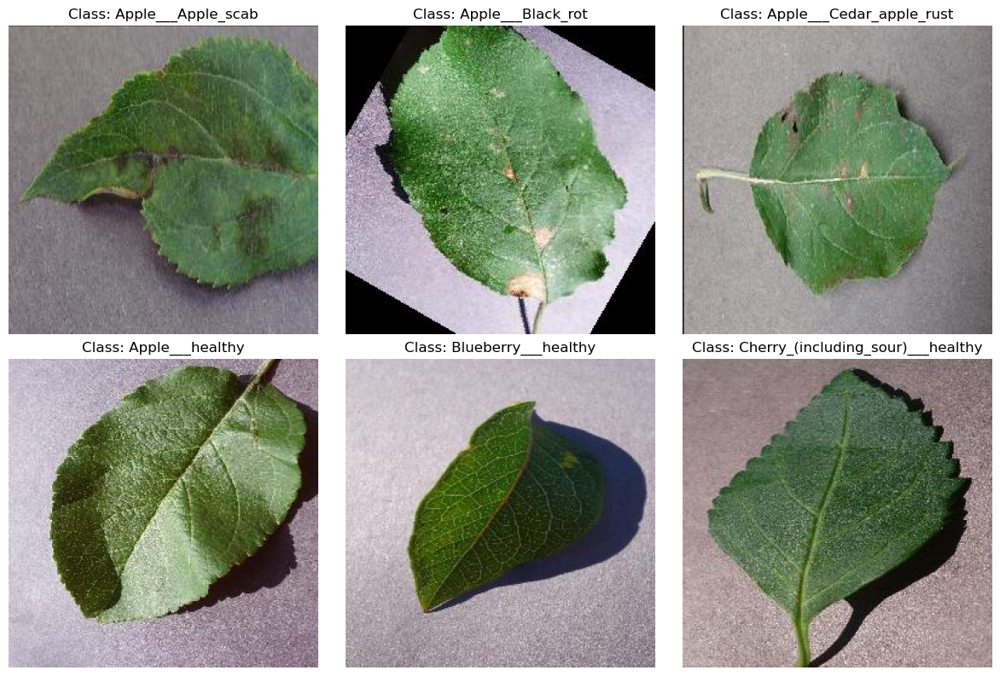

In [3]:
import random
import matplotlib.image as mpimg

# Preview some random images from each class
num_images = 6  # Number of random images to preview
fig, axes = plt.subplots(2, 3, figsize=(12, 8))  # Create a 2x3 grid for the images

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Track which index to use for the next subplot
index = 0

# Loop through subdirectories (classes) and pick random images
for subdir in subdirs_train:
    dir_path = os.path.join(train_path, subdir)
    img_files = os.listdir(dir_path)

    # Pick a random image from the class
    random_image = random.choice(img_files)
    img_path = os.path.join(dir_path, random_image)
    img = mpimg.imread(img_path)

    # Display the image in the corresponding subplot
    axes[index].imshow(img)
    axes[index].set_title(f"Class: {subdir}")
    axes[index].axis('off')  # Hide axes
    index += 1

    # Stop once we have displayed the required number of images
    if index >= num_images:
        break

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


# 4. IMAGE SIZE AND RESOLUTION

In [4]:
from PIL import Image

# Assume you want to check all images in the dataset (train set)
all_sizes_are_same = True
all_formats_are_same = True
expected_size = None  # To store the first image's size for comparison
expected_format = None  # To store the first image's format for comparison

# Check the size and format of all images
for subdir in subdirs_train:
    dir_path = os.path.join(train_path, subdir)
    img_files = os.listdir(dir_path)

    for img_file in img_files:
        img_path = os.path.join(dir_path, img_file)
        img = Image.open(img_path)

        # Get the size and format of the current image
        img_size = img.size
        img_format = img.format

        # Set the expected size and format for the first image
        if expected_size is None:
            expected_size = img_size
        if expected_format is None:
            expected_format = img_format

        # Check if the current image size matches the expected size
        if img_size != expected_size:
            all_sizes_are_same = False
            print(f"Image {img_file} in class {subdir} has size {img_size} which is different from expected size {expected_size}")

        # Check if the current image format matches the expected format
        if img_format != expected_format:
            all_formats_are_same = False
            print(f"Image {img_file} in class {subdir} has format {img_format} which is different from expected format {expected_format}")

# Print the final result
if all_sizes_are_same:
    print("All images are of the same size in training set.",expected_size)
else:
    print("Some images have different sizes in taining set.")

if all_formats_are_same:
    print("All images are of the same format in training set.",expected_format)
else:
    print("Some images have different formats in training set.")



# Assume you want to check all images in the dataset (validation sets)
all_sizes_are_same = True
all_formats_are_same = True
expected_size = None  # To store the first image's size for comparison
expected_format = None  # To store the first image's format for comparison

# Check the size and format of all images
for subdir in subdirs_valid:
    dir_path = os.path.join(valid_path, subdir)
    img_files = os.listdir(dir_path)

    for img_file in img_files:
        img_path = os.path.join(dir_path, img_file)
        img = Image.open(img_path)

        # Get the size and format of the current image
        img_size = img.size
        img_format = img.format

        # Set the expected size and format for the first image
        if expected_size is None:
            expected_size = img_size
        if expected_format is None:
            expected_format = img_format

        # Check if the current image size matches the expected size
        if img_size != expected_size:
            all_sizes_are_same = False
            print(f"Image {img_file} in class {subdir} has size {img_size} which is different from expected size {expected_size}")

        # Check if the current image format matches the expected format
        if img_format != expected_format:
            all_formats_are_same = False
            print(f"Image {img_file} in class {subdir} has format {img_format} which is different from expected format {expected_format}")

# Print the final result
if all_sizes_are_same:
    print("All images are of the same size in validation set.",expected_size)
else:
    print("Some images have different sizes in validation set.")

if all_formats_are_same:
    print("All images are of the same format in validation set.",expected_format)
else:
    print("Some images have different formats in validation set.")



All images are of the same size in training set. (256, 256)
All images are of the same format in training set. JPEG
All images are of the same size in validation set. (256, 256)
All images are of the same format in validation set. JPEG


**✅ ALL IMAGES ARE OF SAME SIZE (256,256) AND OF SAME FORMAT JPEG**

# 5. CHECK FOR MISSING DATA OR CORRUPTED FILES

In [11]:
# Check for any corrupted or unreadable image files in training set
corrupt_files = []
for subdir in subdirs_train:
    dir_path = os.path.join(train_path, subdir)
    img_files = os.listdir(dir_path)
    for img_file in img_files:
        img_path = os.path.join(dir_path, img_file)
        try:
            img = Image.open(img_path)
            img.verify()  # Verify image integrity
        except (IOError, SyntaxError) as e:
            corrupt_files.append(img_path)

if corrupt_files:
    print(f"Corrupted files found in training set: {corrupt_files}")
else:
    print("No corrupted files found in training set.")





# Check for any corrupted or unreadable image files in validation set
corrupt_files = []
for subdir in subdirs_valid:
    dir_path = os.path.join(valid_path, subdir)
    img_files = os.listdir(dir_path)
    for img_file in img_files:
        img_path = os.path.join(dir_path, img_file)
        try:
            img = Image.open(img_path)
            img.verify()  # Verify image integrity
        except (IOError, SyntaxError) as e:
            corrupt_files.append(img_path)

if corrupt_files:
    print(f"Corrupted files found in validation set: {corrupt_files}")
else:
    print("No corrupted files found in validation set.")


No corrupted files found in training set.
No corrupted files found in validation set.


✅**ALL IMAGES ARE ACCESSIBLE AND GOOD**

# 6. AUGMENTATION
     ✅**SINCE THIS DATASET IS ALREADY OFFLINE AUGMENTED SO NO NEED TO AUGMENT FURTHER**

# **MODEL BUILDING**

# 1. Load Dataset for Training and Validation

In [5]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Normalization only
train_datagen = ImageDataGenerator(
    rotation_range=90,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=1/255.0,

    preprocessing_function=None)

val_datagen = ImageDataGenerator(rescale=1/255.0)

# Load datasets
train_generator = train_datagen.flow_from_directory(
    r'C:\Users\FAISAL\Machine_learning\myproject\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    shuffle=True

)


valid_generator = val_datagen.flow_from_directory(
    r'C:\Users\FAISAL\Machine_learning\myproject\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\valid',
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    shuffle=True
)
train_generator.class_indices


Found 70295 images belonging to 38 classes.
Found 17572 images belonging to 38 classes.


{'Apple___Apple_scab': 0,
 'Apple___Black_rot': 1,
 'Apple___Cedar_apple_rust': 2,
 'Apple___healthy': 3,
 'Blueberry___healthy': 4,
 'Cherry_(including_sour)___Powdery_mildew': 5,
 'Cherry_(including_sour)___healthy': 6,
 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot': 7,
 'Corn_(maize)___Common_rust_': 8,
 'Corn_(maize)___Northern_Leaf_Blight': 9,
 'Corn_(maize)___healthy': 10,
 'Grape___Black_rot': 11,
 'Grape___Esca_(Black_Measles)': 12,
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)': 13,
 'Grape___healthy': 14,
 'Orange___Haunglongbing_(Citrus_greening)': 15,
 'Peach___Bacterial_spot': 16,
 'Peach___healthy': 17,
 'Pepper,_bell___Bacterial_spot': 18,
 'Pepper,_bell___healthy': 19,
 'Potato___Early_blight': 20,
 'Potato___Late_blight': 21,
 'Potato___healthy': 22,
 'Raspberry___healthy': 23,
 'Soybean___healthy': 24,
 'Squash___Powdery_mildew': 25,
 'Strawberry___Leaf_scorch': 26,
 'Strawberry___healthy': 27,
 'Tomato___Bacterial_spot': 28,
 'Tomato___Early_blight': 29,
 'Toma

# display some images from training set

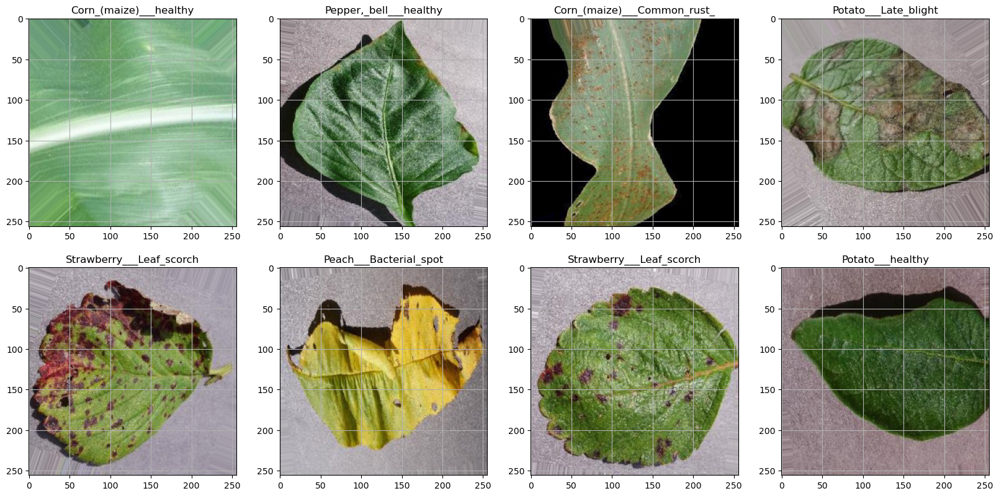

In [6]:
import numpy as np
import matplotlib.pyplot as plt


classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,8):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])   # when y is categorical
        # plt.title(classes[int(y_batch[i])])   # when y is binary or sparse
        plt.grid(None)
    # show the plot
    plt.show()
    break


# 4. MODEL BUILDING

In [21]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping





model = Sequential()

# Convolutional layers
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(256, 256, 3)))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(256, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the output from convolutional layers
model.add(Flatten())

# Fully connected layers
model.add(Dense(512, activation='relu'))
model.add(Dropout(0.5))  # Dropout to prevent overfitting
model.add(Dense(38, activation='softmax'))  # Output layer with softmax

# Compile the model
from tensorflow.keras.metrics import Precision

model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', Precision()])


# Summary of the model
model.summary()


Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_8 (Conv2D)            (None, 254, 254, 32)      896       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 127, 127, 32)      0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 125, 125, 64)      18496     
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 62, 62, 64)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 60, 60, 128)       73856     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 30, 30, 128)       0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 28, 28, 256)      

# 5. MODEL TRAINING

Epoch 1/16
2197/2197 [==============================] - 855s 386ms/step - loss: 1.4902 - accuracy: 0.5568 - precision: 0.7870 - val_loss: 0.7291 - val_accuracy: 0.7644 - val_precision: 0.8390
Epoch 2/16
2197/2197 [==============================] - 817s 372ms/step - loss: 0.5976 - accuracy: 0.8107 - precision: 0.8658 - val_loss: 0.4022 - val_accuracy: 0.8664 - val_precision: 0.9007
Epoch 3/16
2197/2197 [==============================] - 835s 380ms/step - loss: 0.4261 - accuracy: 0.8642 - precision: 0.8987 - val_loss: 0.3549 - val_accuracy: 0.8836 - val_precision: 0.9060
Epoch 4/16
2197/2197 [==============================] - 826s 376ms/step - loss: 0.3508 - accuracy: 0.8883 - precision: 0.9126 - val_loss: 0.2248 - val_accuracy: 0.9254 - val_precision: 0.9404
Epoch 5/16
2197/2197 [==============================] - 827s 376ms/step - loss: 0.2969 - accuracy: 0.9060 - precision: 0.9248 - val_loss: 0.2262 - val_accuracy: 0.9261 - val_precision: 0.9402
Epoch 6/16
2197/2197 [==================

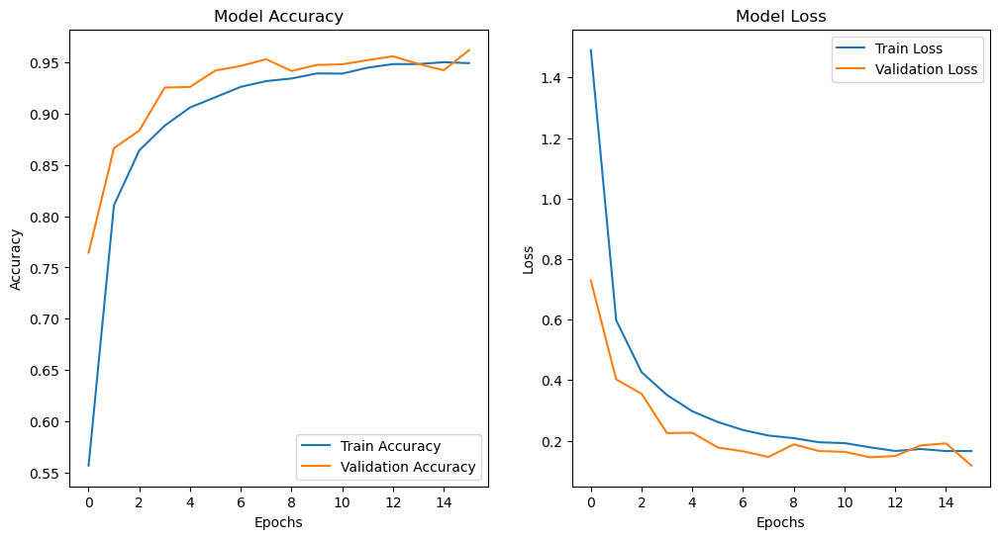

In [22]:
# Define EarlyStopping callback
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint,ReduceLROnPlateau

early_stopping = EarlyStopping(monitor='val_loss', patience=4, restore_best_weights=True)

model_checkpoint = ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

model_ReduceLROnPlateau = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=4, min_lr=0.000001)

callbacks=[early_stopping,model_checkpoint,model_ReduceLROnPlateau]


history = model.fit(
    train_generator,
   # steps_per_epoch=(train_generator.samples // train_generator.batch_size),
    epochs=16,  # Set a larger number of epochs
    validation_data=valid_generator,
   # validation_steps=(valid_generator.samples // valid_generator.batch_size),
    callbacks=callbacks  # Add early stopping callback
)


plt.figure(figsize=(12, 6))

# Plot Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Plot Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()



<H1>Test model on test_data</H1> 

Found 33 images belonging to 1 classes.
Accuracy: 93.94%

Correct Predictions:
Image: AppleCedarRust1.JPG | True Label: 2 | Predicted Label: 2
Image: AppleCedarRust3.JPG | True Label: 2 | Predicted Label: 2
Image: AppleCedarRust4.JPG | True Label: 2 | Predicted Label: 2
Image: AppleScab1.JPG | True Label: 0 | Predicted Label: 0
Image: AppleScab2.JPG | True Label: 0 | Predicted Label: 0
Image: AppleScab3.JPG | True Label: 0 | Predicted Label: 0
Image: CornCommonRust1.JPG | True Label: 8 | Predicted Label: 8
Image: CornCommonRust2.JPG | True Label: 8 | Predicted Label: 8
Image: CornCommonRust3.JPG | True Label: 8 | Predicted Label: 8
Image: PotatoEarlyBlight1.JPG | True Label: 20 | Predicted Label: 20
Image: PotatoEarlyBlight2.JPG | True Label: 20 | Predicted Label: 20
Image: PotatoEarlyBlight3.JPG | True Label: 20 | Predicted Label: 20
Image: PotatoEarlyBlight4.JPG | True Label: 20 | Predicted Label: 20
Image: PotatoEarlyBlight5.JPG | True Label: 20 | Predicted Label: 20
Image: PotatoHe

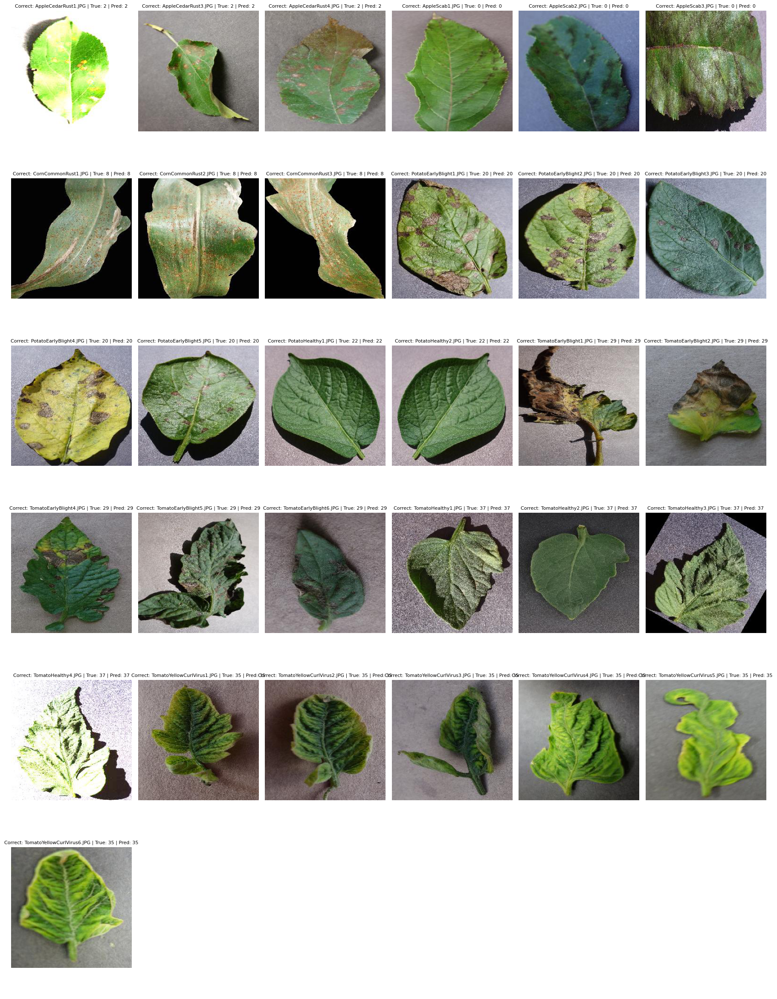

Displaying Incorrect Predictions:


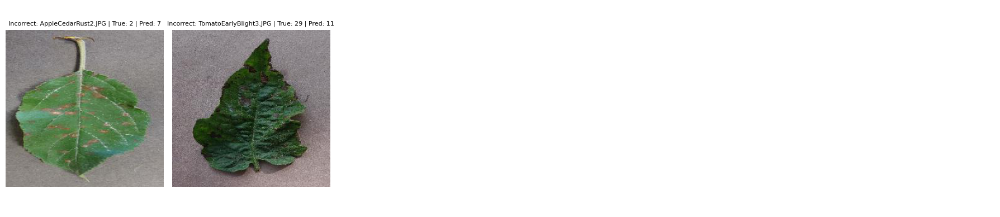

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
from collections import defaultdict
from sklearn.metrics import confusion_matrix
import seaborn as sns
import os

# Load test data using ImageDataGenerator (already set up correctly)
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    r'C:\Users\FAISAL\Machine_learning\myproject\test',  # Test data directory
    target_size=(256, 256),
    batch_size=1,  # Use batch_size=1 for individual image prediction
    class_mode=None,  # No labels for prediction
    shuffle=False
)

# True labels for your test images (make sure the number of labels matches the number of test images)
true_labels = [2, 2, 2, 2, 0, 0, 0, 8, 8, 8, 20, 20, 20, 20, 20, 22, 22, 29, 29, 29, 29, 29, 29, 37, 37, 37, 37, 35, 35, 35, 35, 35, 35]

# Predict the classes using the trained model
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Calculate accuracy
accuracy = accuracy_score(true_labels, predicted_classes)
print(f"Accuracy: {accuracy * 100:.2f}%")

# Prepare to display correct and incorrect predictions
correct_images = []
incorrect_images = []
correct_labels = []
incorrect_labels = []

# Get file paths for test images
file_paths = test_generator.filepaths

# Loop through each image and compare the true vs predicted labels
for i in range(len(true_labels)):
    image_name = os.path.basename(file_paths[i])  # Get the image file name
    true_label = true_labels[i]
    predicted_label = predicted_classes[i]

    # If the prediction is correct, add it to the correct list
    if true_label == predicted_label:
        correct_images.append((image_name, true_label, predicted_label))
        correct_labels.append(true_label)
    else:
        incorrect_images.append((image_name, true_label, predicted_label))
        incorrect_labels.append(true_label)

# Print Correct Predictions
print("\nCorrect Predictions:")
for image_name, true_label, predicted_label in correct_images:
    print(f"Image: {image_name} | True Label: {true_label} | Predicted Label: {predicted_label}")

# Print Incorrect Predictions
print("\nIncorrect Predictions:")
for image_name, true_label, predicted_label in incorrect_images:
    print(f"Image: {image_name} | True Label: {true_label} | Predicted Label: {predicted_label}")

# Display a few example images with correct and incorrect predictions

import os
import matplotlib.pyplot as plt
import math

def display_images_in_grid(images, titles, max_columns=6):
    # Calculate number of rows needed for the grid
    num_images = len(images)
    num_rows = math.ceil(num_images / max_columns)
    
    # Create a grid of subplots
    fig, axes = plt.subplots(nrows=num_rows, ncols=max_columns, figsize=(max_columns * 3, num_rows * 4))
    axes = axes.flatten()  # Flatten the axes array for easy indexing
    
    for i, (image, title) in enumerate(zip(images, titles)):
        ax = axes[i]
        ax.imshow(image)
        ax.set_title(title, fontsize=8)
        ax.axis('off')  # Turn off axis
    
    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()  # Adjust layout to avoid overlap
    plt.show()

# Collect the correct images and titles (all of them)
correct_images_to_show = []
correct_titles = []

for image_name, true_label, predicted_label in correct_images:  # No slicing here
    image_path = os.path.join(r'C:\Users\FAISAL\Machine_learning\myproject\test\test', image_name)
    if os.path.exists(image_path):
        img = plt.imread(image_path)
        correct_images_to_show.append(img)
        correct_titles.append(f"Correct: {image_name} | True: {true_label} | Pred: {predicted_label}")

# Collect the incorrect images and titles (all of them)
incorrect_images_to_show = []
incorrect_titles = []

for image_name, true_label, predicted_label in incorrect_images:  # No slicing here
    image_path = os.path.join(r'C:\Users\FAISAL\Machine_learning\myproject\test\test', image_name)
    if os.path.exists(image_path):
        img = plt.imread(image_path)
        incorrect_images_to_show.append(img)
        incorrect_titles.append(f"Incorrect: {image_name} | True: {true_label} | Pred: {predicted_label}")

# Display the correct images in a grid
print("Displaying Correct Predictions:")
display_images_in_grid(correct_images_to_show, correct_titles, max_columns=6)  # Adjust number of columns as needed

# Display the incorrect images in a grid
print("Displaying Incorrect Predictions:")
display_images_in_grid(incorrect_images_to_show, incorrect_titles, max_columns=6)  # Adjust number of columns as needed





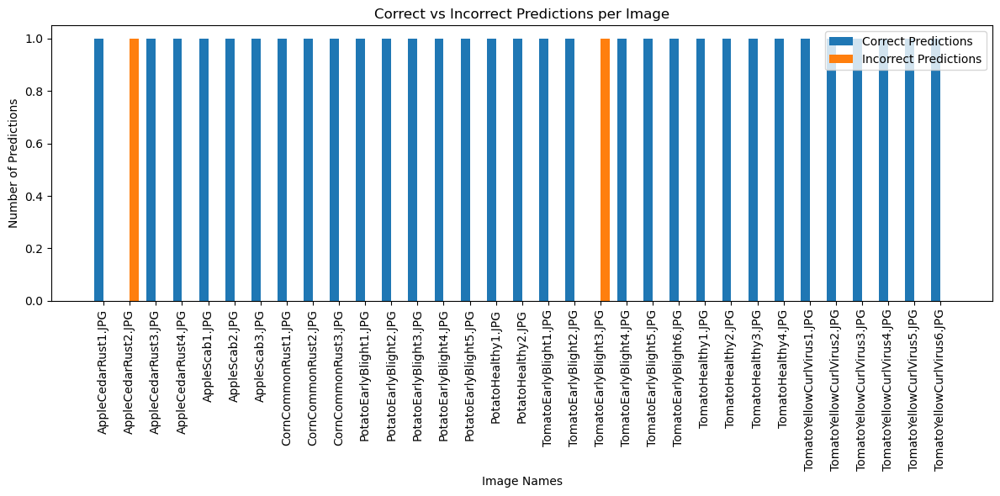

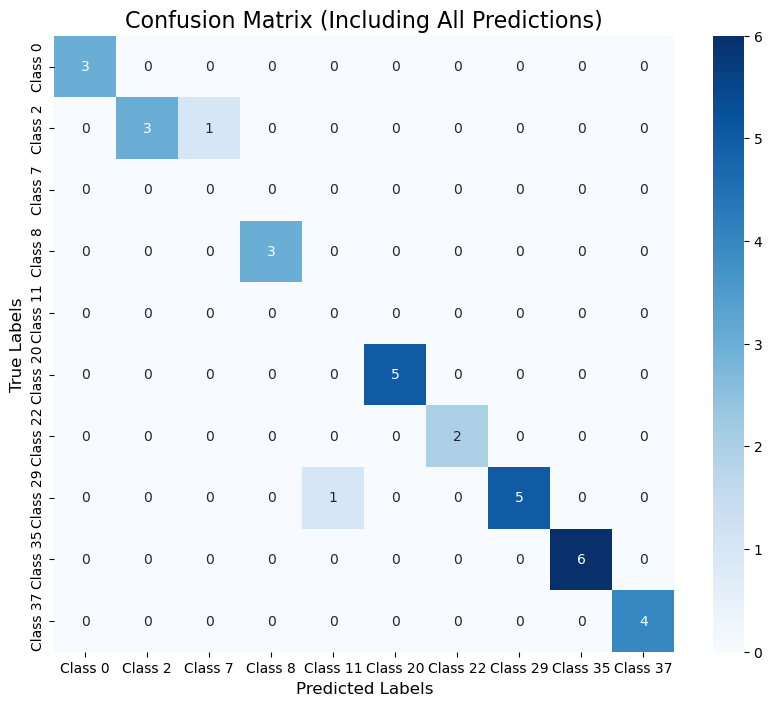


Incorrect Predictions:
Image: AppleCedarRust2.JPG | True Label: 2 | Predicted Label: 7
Image: TomatoEarlyBlight3.JPG | True Label: 29 | Predicted Label: 11


In [83]:


# Prepare to display correct and incorrect predictions
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict
import os

# Initialize counters for correct and incorrect predictions
correct_counts = defaultdict(int)
incorrect_counts = defaultdict(int)

# Get file paths for test images
file_paths = test_generator.filepaths

# Loop through each image and compare the true vs predicted labels
for i in range(len(true_labels)):
    true_label = true_labels[i]
    predicted_label = predicted_classes[i]
    
    if true_label == predicted_label:
        correct_counts[file_paths[i]] += 1  # Track correct predictions by image path
    else:
        incorrect_counts[file_paths[i]] += 1  # Track incorrect predictions by image path

# Create the plot
x = np.arange(len(file_paths))  # Number of images
width = 0.35  # Bar width

fig, ax = plt.subplots(figsize=(12, 6))

# Get the counts for correct and incorrect predictions
correct_values = [correct_counts[file] for file in file_paths]
incorrect_values = [incorrect_counts[file] for file in file_paths]

# Plotting correct and incorrect bars
rects1 = ax.bar(x - width / 2, correct_values, width, label='Correct Predictions')
rects2 = ax.bar(x + width / 2, incorrect_values, width, label='Incorrect Predictions')

# Add labels, title, and x-axis ticks
ax.set_xlabel('Image Names')
ax.set_ylabel('Number of Predictions')
ax.set_title('Correct vs Incorrect Predictions per Image')
ax.set_xticks(x)
ax.set_xticklabels([os.path.basename(file) for file in file_paths], rotation=90)
ax.legend()

# Adjust layout for better fit
fig.tight_layout()

# Show the plot
plt.show()

cm = confusion_matrix(true_labels, predicted_classes, labels=all_labels)

# Map labels to class names or indices for visualization
class_names = [f"Class {label}" for label in all_labels]  # Replace with specific class names if available

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=class_names,
    yticklabels=class_names
)

plt.title('Confusion Matrix (Including All Predictions)', fontsize=16)
plt.xlabel('Predicted Labels', fontsize=12)
plt.ylabel('True Labels', fontsize=12)
plt.show()

# Additional Analysis: Print incorrect predictions with image names
print("\nIncorrect Predictions:")
file_paths = test_generator.filepaths  # File paths for test images

for i, (true, pred) in enumerate(zip(true_labels, predicted_classes)):
    if true != pred:
        image_name = os.path.basename(file_paths[i])  # Extract image file name
        print(f"Image: {image_name} | True Label: {true} | Predicted Label: {pred}")



In [59]:
# Save the entire model (architecture + weights) in SavedModel format
model.save('my_full_model_saved')


INFO:tensorflow:Assets written to: my_full_model_saved\assets
